In [2]:
pip install scikit-learn-extra

Note: you may need to restart the kernel to use updated packages.


In [4]:
import pandas as pd
from sklearn_extra.cluster import KMedoids
import matplotlib.pyplot as plt

In [6]:
data = pd.read_csv('/Users/niloy74/UoB/Data Analytics and Predictive Modelling/report.csv')
data

,FullName,ClubName,AgeGroup,Position,FIFARating,MinutesPlayed,GAContribution,FantasyScore,MarketValue,TransferStatus
0,Erling Haaland,Manchester City,21 and under,Forward,88,2767,45,7.8,180000000,Retained
1,Bukayo Saka,Arsenal,21 and under,Midfielder,82,3183,26,5.3,120000000,Retained
2,Declan Rice,West Ham United,22-25,Midfielder,84,3272,7,3.1,110000000,Transferred
3,Mohamed Salah,Liverpool,30 and above,Forward,90,3290,32,6.3,110000000,Retained
4,Phil Foden,Manchester City,22-25,Midfielder,85,1832,18,4.4,110000000,Retained
...,...,...,...,...,...,...,...,...,...,...
571,Alex Gilbert,Brentford,21 and under,Forward,59,0,0,0.0,100000,Retained
572,Lewis Brunt,Leicester City,21 and under,Midfielder,55,22,0,1.0,100000,Retained
573,Tristan Crama,Brentford,21 and under,Defender,58,0,0,0.0,100000,Retained
574,Tawanda Maswanhise,Leicester City,21 and under,Midfielder,60,0,0,0.0,50000,Retained


Cluster Summary:
   Cluster Number  Total Members IQR FIFARating (25%-75%)  \
0               0            290             (76.0, 82.0)   
1               1            286             (62.0, 75.0)   

  IQR MinutesPlayed (25%-75%) IQR GAContribution (25%-75%)  \
0            (1465.0, 2722.5)                   (1.0, 8.0)   
1                (0.0, 539.5)                   (0.0, 1.0)   

  IQR FantasyScore (25%-75%) IQR MarketValue (25%-75%)  \
0                 (2.3, 3.7)  (15000000.0, 42000000.0)   
1  (0.0, 1.5750000000000002)    (925000.0, 12750000.0)   

   Average Silhouette Score  Average Distance from Medoid  
0                  0.241827                      4.897916  
1                  0.411464                      3.741828  

Validity Metrics:
                 Metric        Value
0      Silhouette Index     0.326057
1  Davies-Bouldin Index     1.401223
2               Inertia  2490.558419
3          Average WCSS  6481.355920

Medoid Distance Matrix:
           Cluster 0  Cluste

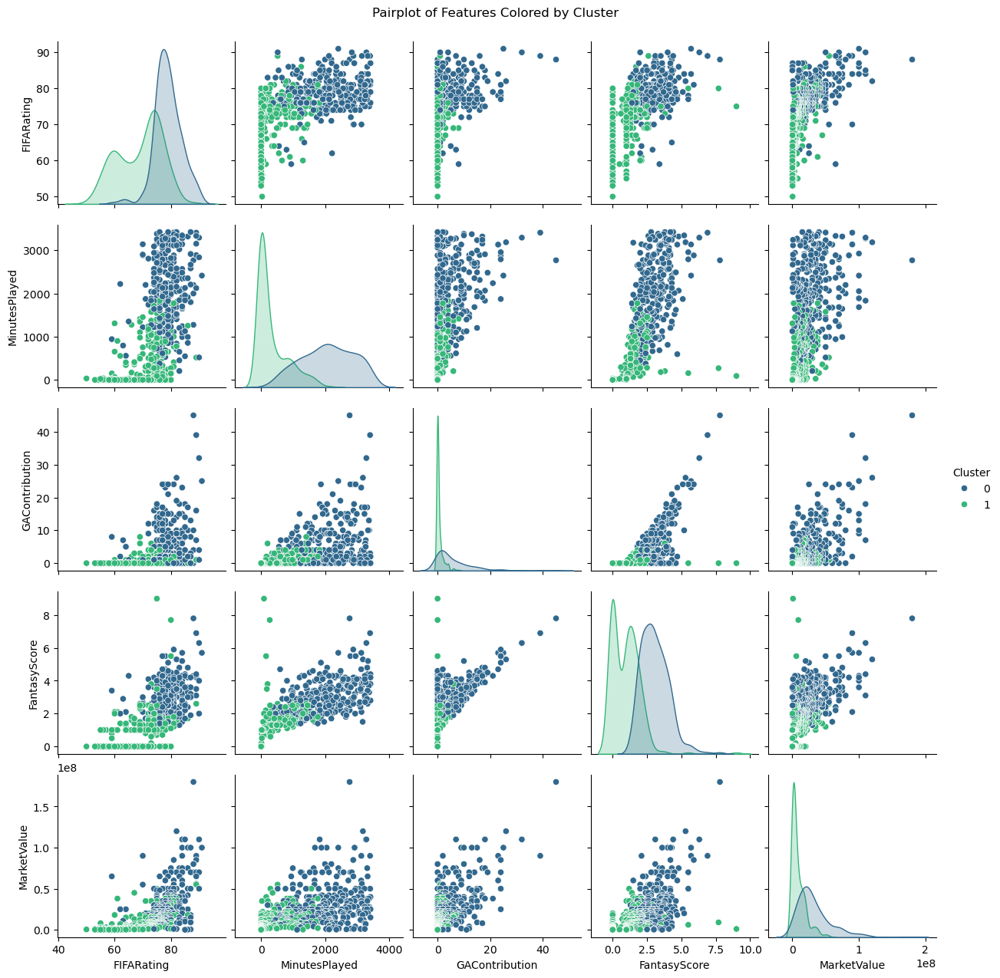

In [88]:
# Manhattan 2 M2

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AgeGroup",
    "Position",
    "FIFARating",
    "MinutesPlayed",
    "GAContribution",
    "FantasyScore",
    "MarketValue",
]

# Encoding qualitative variables
label_encoders = {}
for col in ["AgeGroup", "Position"]:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 2  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="manhattan", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="manhattan")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="cityblock"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="manhattan")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["FIFARating", "MinutesPlayed", "GAContribution", "FantasyScore", "MarketValue"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cityblock")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cityblock")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="cityblock")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("M2cluster_summary.csv", index=False)
validity_metrics_df.to_csv("M2cluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("M2medoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("M2pairplot_clusters.png")
plt.show()


Cluster Summary:
   Cluster Number  Total Members IQR FIFARating (25%-75%)  \
0               0            202             (76.0, 82.0)   
1               1            157             (59.0, 69.0)   
2               2            217             (74.0, 79.0)   

  IQR MinutesPlayed (25%-75%) IQR GAContribution (25%-75%)  \
0           (1328.25, 2706.0)                  (0.0, 5.75)   
1                  (0.0, 8.0)                   (0.0, 0.0)   
2             (600.0, 2099.0)                   (0.0, 6.0)   

  IQR FantasyScore (25%-75%) IQR MarketValue (25%-75%)  \
0                 (2.1, 3.6)  (12000000.0, 38000000.0)   
1                 (0.0, 1.0)     (300000.0, 3500000.0)   
2                 (1.6, 2.9)   (9000000.0, 35000000.0)   

   Average Silhouette Score  Average Distance from Medoid  
0                  0.129861                      4.276426  
1                  0.536742                      2.560064  
2                  0.116649                      3.927163  

Validity Metric

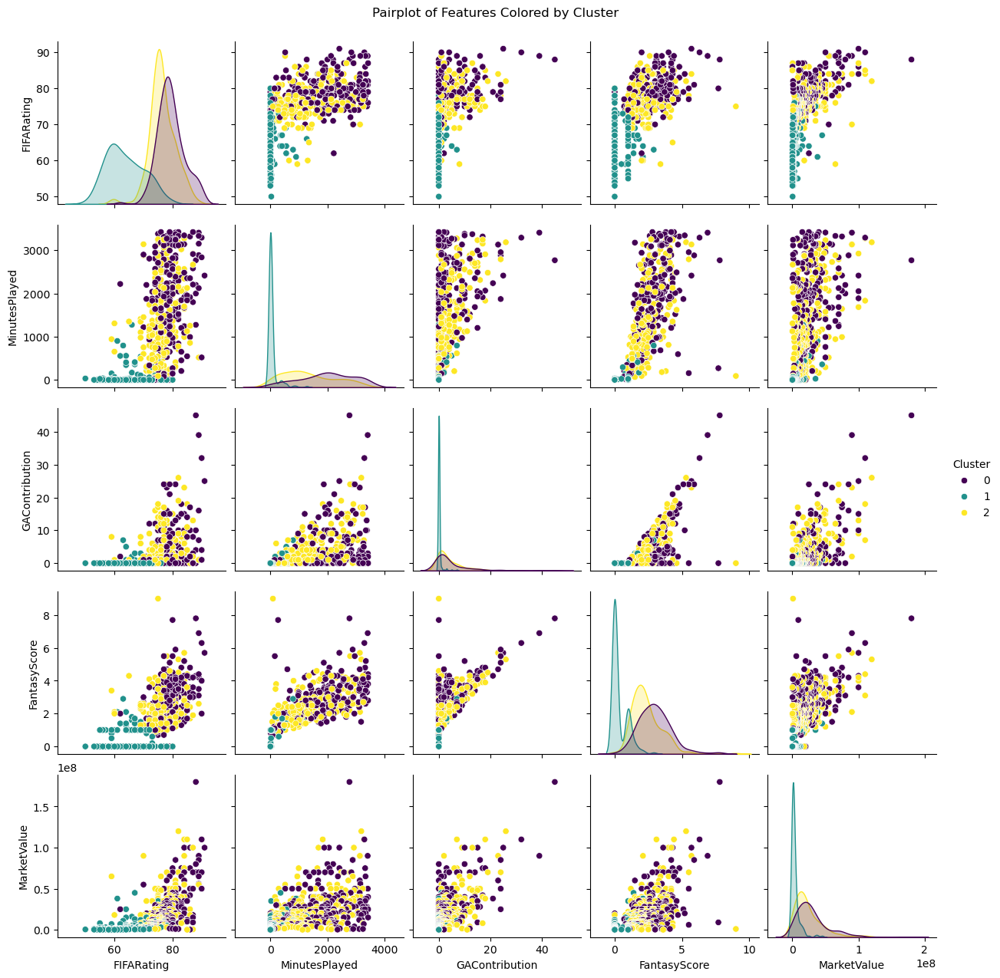

In [58]:
# Manhattan 3 M3

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AgeGroup",
    "Position",
    "FIFARating",
    "MinutesPlayed",
    "GAContribution",
    "FantasyScore",
    "MarketValue",
]

# Encoding qualitative variables
label_encoders = {}
for col in ["AgeGroup", "Position"]:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 3  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="manhattan", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="manhattan")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="cityblock"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="manhattan")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["FIFARating", "MinutesPlayed", "GAContribution", "FantasyScore", "MarketValue"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cityblock")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cityblock")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="cityblock")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("M3cluster_summary.csv", index=False)
validity_metrics_df.to_csv("M3cluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("M3medoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("M3pairplot_clusters.png")
plt.show()


Cluster Summary:
   Cluster Number  Total Members IQR FIFARating (25%-75%)  \
0               0            143             (75.0, 81.0)   
1               1            140             (73.0, 77.0)   
2               2            149             (77.0, 82.0)   
3               3            144             (58.0, 67.0)   

  IQR MinutesPlayed (25%-75%) IQR GAContribution (25%-75%)  \
0            (1403.0, 2694.0)                  (3.0, 10.0)   
1              (144.0, 945.5)                   (0.0, 1.0)   
2            (1461.0, 2805.0)                   (1.0, 5.0)   
3                  (0.0, 8.5)                   (0.0, 0.0)   

  IQR FantasyScore (25%-75%) IQR MarketValue (25%-75%)  \
0                 (2.1, 3.7)  (18000000.0, 45000000.0)   
1  (1.0, 1.9249999999999998)   (5000000.0, 17000000.0)   
2                 (2.5, 3.7)  (15000000.0, 40000000.0)   
3                 (0.0, 1.0)     (275000.0, 3000000.0)   

   Average Silhouette Score  Average Distance from Medoid  
0              

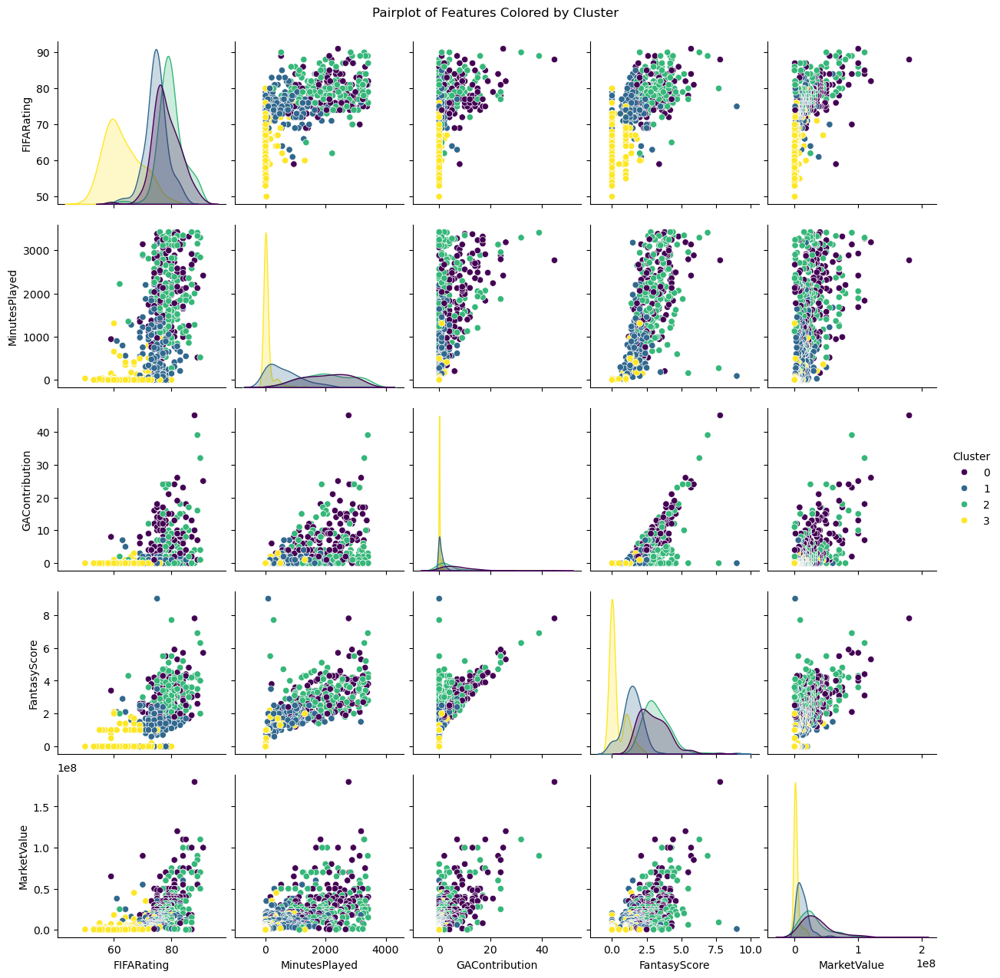

In [60]:
# Manhattan 4 M4

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AgeGroup",
    "Position",
    "FIFARating",
    "MinutesPlayed",
    "GAContribution",
    "FantasyScore",
    "MarketValue",
]

# Encoding qualitative variables
label_encoders = {}
for col in ["AgeGroup", "Position"]:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 4  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="manhattan", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="manhattan")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="cityblock"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="manhattan")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["FIFARating", "MinutesPlayed", "GAContribution", "FantasyScore", "MarketValue"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cityblock")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cityblock")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="cityblock")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("M4cluster_summary.csv", index=False)
validity_metrics_df.to_csv("M4cluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("M4medoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("M4pairplot_clusters.png")
plt.show()


Cluster Summary:
   Cluster Number  Total Members IQR FIFARating (25%-75%)  \
0               0            175             (74.0, 80.0)   
1               1             61             (59.0, 68.0)   
2               2            127             (74.0, 78.0)   
3               3             97             (59.0, 68.0)   
4               4            116             (78.0, 84.0)   

  IQR MinutesPlayed (25%-75%) IQR GAContribution (25%-75%)  \
0             (767.5, 2384.5)                   (1.0, 7.0)   
1                 (0.0, 24.0)                   (0.0, 0.0)   
2             (361.5, 1585.5)                   (0.0, 1.0)   
3                 (0.0, 10.0)                   (0.0, 0.0)   
4           (1912.75, 3115.0)                  (1.0, 10.0)   

  IQR FantasyScore (25%-75%) IQR MarketValue (25%-75%)  \
0                (1.75, 3.1)  (12000000.0, 35000000.0)   
1                 (0.0, 1.0)     (300000.0, 7000000.0)   
2                 (1.4, 2.4)   (6000000.0, 18000000.0)   
3          

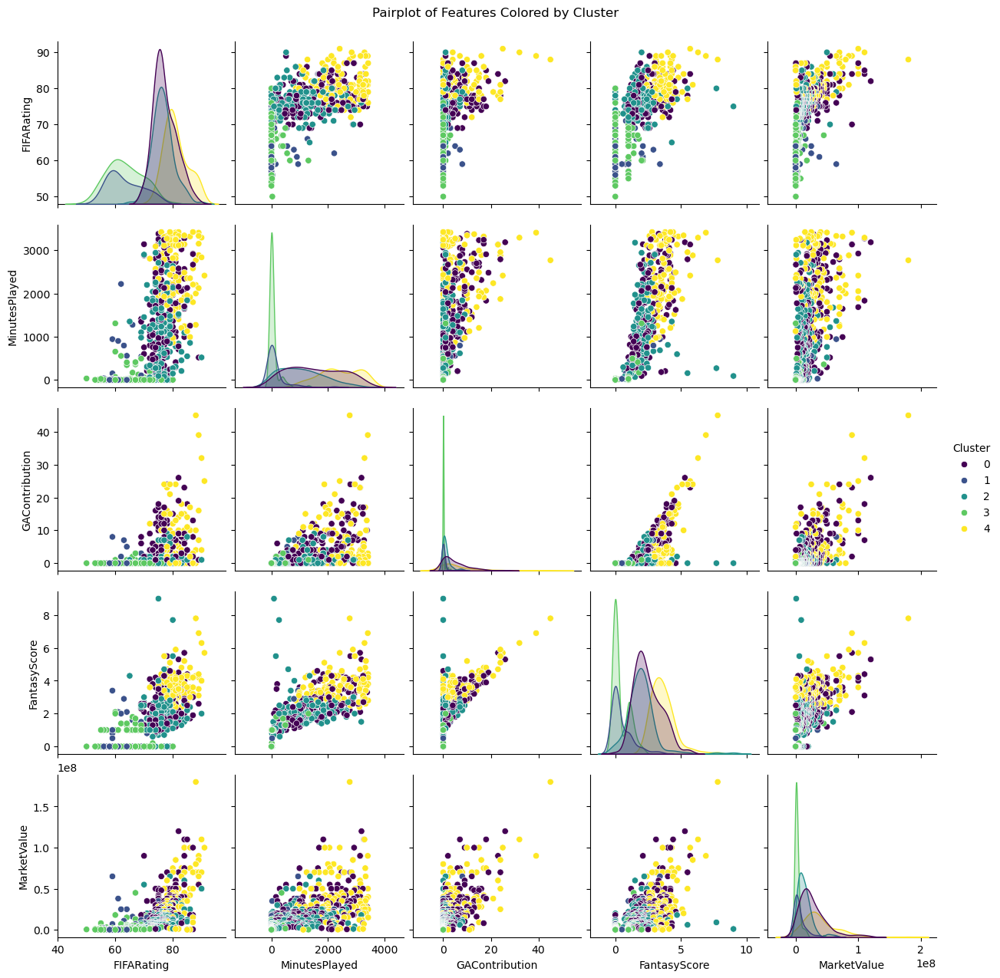

In [64]:
# Manhattan 5 M5

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AgeGroup",
    "Position",
    "FIFARating",
    "MinutesPlayed",
    "GAContribution",
    "FantasyScore",
    "MarketValue",
]

# Encoding qualitative variables
label_encoders = {}
for col in ["AgeGroup", "Position"]:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 5  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="manhattan", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="manhattan")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="cityblock"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="manhattan")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["FIFARating", "MinutesPlayed", "GAContribution", "FantasyScore", "MarketValue"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cityblock")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cityblock")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="cityblock")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("M5cluster_summary.csv", index=False)
validity_metrics_df.to_csv("M5cluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("M5medoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("M5pairplot_clusters.png")
plt.show()


Cluster Summary:
   Cluster Number  Total Members IQR FIFARating (25%-75%)  \
0               0            145             (74.0, 80.0)   
1               1             78             (69.0, 74.0)   
2               2             94             (75.0, 79.0)   
3               3             55             (77.0, 83.5)   
4               4             92             (78.0, 83.0)   
5               5            112             (58.0, 64.0)   

  IQR MinutesPlayed (25%-75%) IQR GAContribution (25%-75%)  \
0             (752.0, 2122.0)                   (1.0, 7.0)   
1               (0.0, 229.75)                   (0.0, 0.0)   
2           (712.25, 1824.25)                   (0.0, 2.0)   
3            (2345.5, 3166.5)                  (0.0, 13.5)   
4          (1780.75, 2846.25)                  (2.0, 10.0)   
5                  (0.0, 1.0)                   (0.0, 0.0)   

  IQR FantasyScore (25%-75%) IQR MarketValue (25%-75%)  \
0                 (1.7, 2.9)  (12000000.0, 35000000.0)   
1   

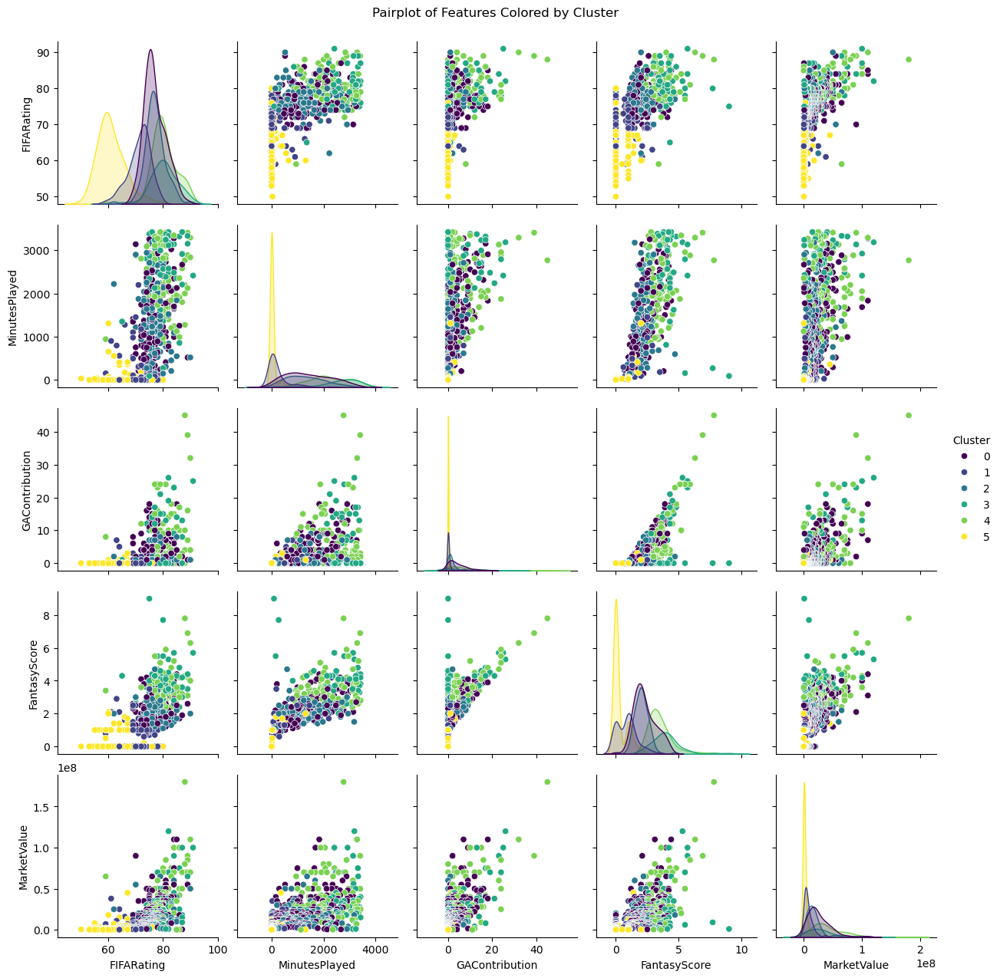

In [66]:
# Manhattan 6 M6

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AgeGroup",
    "Position",
    "FIFARating",
    "MinutesPlayed",
    "GAContribution",
    "FantasyScore",
    "MarketValue",
]

# Encoding qualitative variables
label_encoders = {}
for col in ["AgeGroup", "Position"]:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 6  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="manhattan", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="manhattan")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="cityblock"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="manhattan")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["FIFARating", "MinutesPlayed", "GAContribution", "FantasyScore", "MarketValue"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cityblock")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cityblock")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="cityblock")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("M6cluster_summary.csv", index=False)
validity_metrics_df.to_csv("M6cluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("M6medoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("M6pairplot_clusters.png")
plt.show()


Cluster Summary:
   Cluster Number  Total Members IQR FIFARating (25%-75%)  \
0               0            275             (76.0, 82.0)   
1               1            301             (62.0, 75.0)   

  IQR MinutesPlayed (25%-75%) IQR GAContribution (25%-75%)  \
0            (1576.5, 2776.0)                   (1.0, 9.0)   
1                (0.0, 648.0)                   (0.0, 1.0)   

  IQR FantasyScore (25%-75%) IQR MarketValue (25%-75%)  \
0                 (2.4, 3.7)  (15000000.0, 42000000.0)   
1                 (0.0, 1.6)   (1000000.0, 15000000.0)   

   Average Silhouette Score  Average Distance from Medoid  
0                  0.206608                      2.312888  
1                  0.342919                      1.977993  

Validity Metrics:
                 Metric        Value
0      Silhouette Index     0.277840
1  Davies-Bouldin Index     1.367627
2               Inertia  1231.420227
3          Average WCSS  1528.052361

Medoid Distance Matrix:
           Cluster 0  Cluste

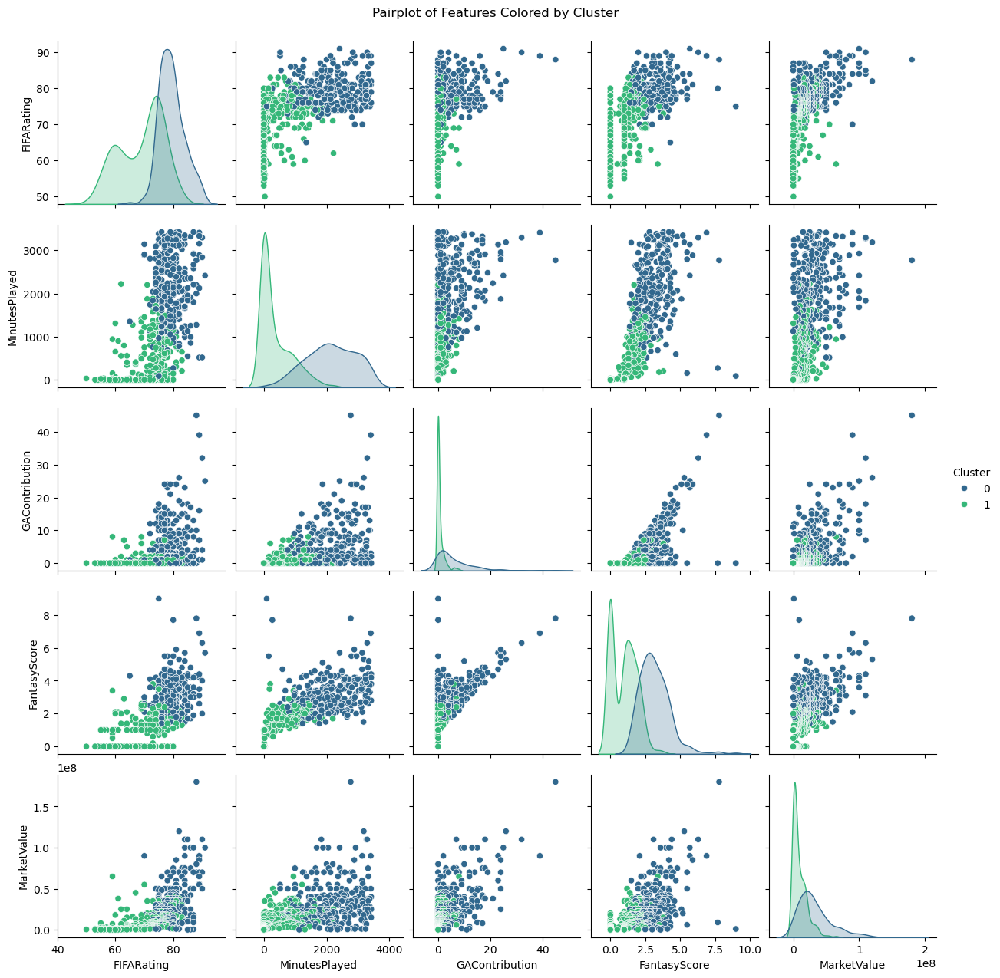

In [68]:
# Euclidean 2 E2

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AgeGroup",
    "Position",
    "FIFARating",
    "MinutesPlayed",
    "GAContribution",
    "FantasyScore",
    "MarketValue",
]

# Encoding qualitative variables
label_encoders = {}
for col in ["AgeGroup", "Position"]:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 2  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="euclidean", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="euclidean")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="euclidean"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="euclidean")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["FIFARating", "MinutesPlayed", "GAContribution", "FantasyScore", "MarketValue"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="euclidean")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="euclidean")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="euclidean")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("E2cluster_summary.csv", index=False)
validity_metrics_df.to_csv("E2cluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("E2medoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("E2pairplot_clusters.png")
plt.show()


Cluster Summary:
   Cluster Number  Total Members IQR FIFARating (25%-75%)  \
0               0            237             (76.0, 82.0)   
1               1            150            (74.0, 79.75)   
2               2            189             (59.0, 72.0)   

  IQR MinutesPlayed (25%-75%) IQR GAContribution (25%-75%)  \
0            (1740.0, 2880.0)                  (2.0, 10.0)   
1            (385.75, 1320.0)                   (0.0, 1.0)   
2                (0.0, 124.0)                   (0.0, 0.0)   

  IQR FantasyScore (25%-75%) IQR MarketValue (25%-75%)  \
0                 (2.5, 3.9)  (17000000.0, 45000000.0)   
1                 (1.4, 2.4)   (7000000.0, 25000000.0)   
2                 (0.0, 1.0)     (350000.0, 7000000.0)   

   Average Silhouette Score  Average Distance from Medoid  
0                  0.045135                      2.406160  
1                  0.277364                      1.642421  
2                  0.289999                      1.741660  

Validity Metric

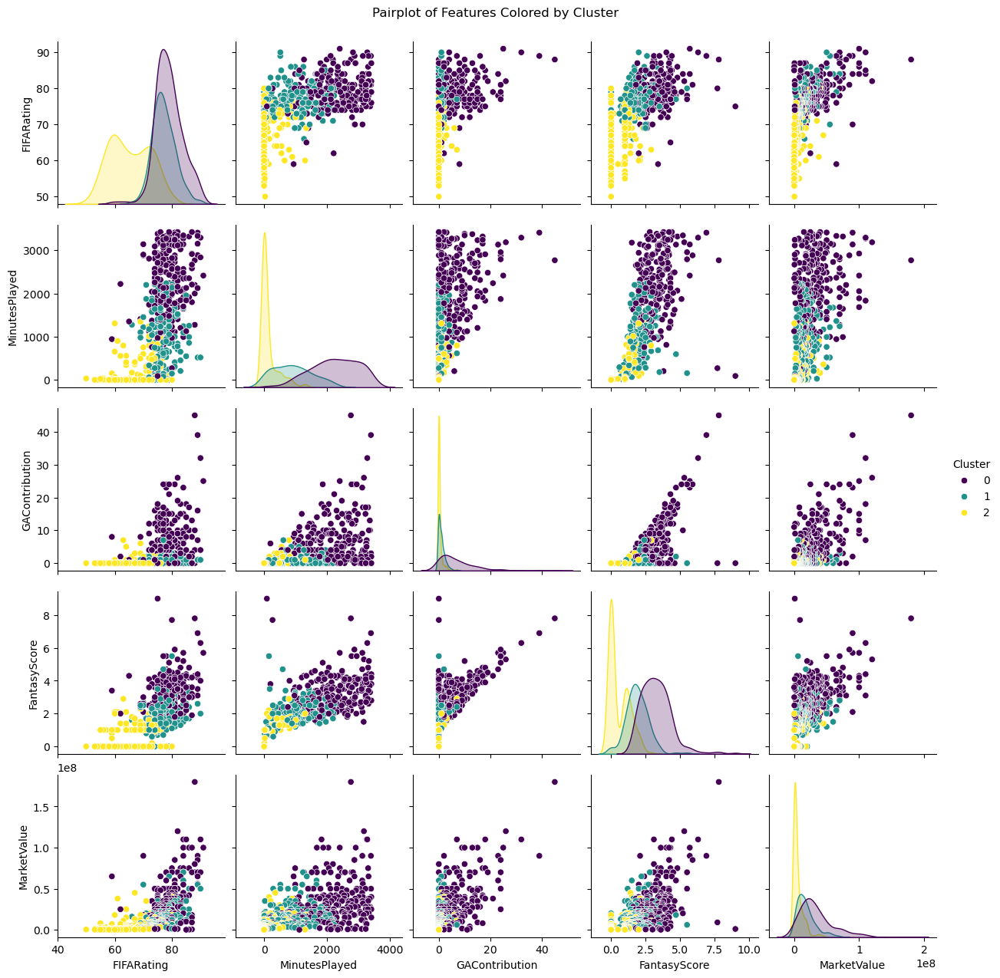

In [70]:
# Euclidean 3 E3

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AgeGroup",
    "Position",
    "FIFARating",
    "MinutesPlayed",
    "GAContribution",
    "FantasyScore",
    "MarketValue",
]

# Encoding qualitative variables
label_encoders = {}
for col in ["AgeGroup", "Position"]:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 3  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="euclidean", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="euclidean")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="euclidean"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="euclidean")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["FIFARating", "MinutesPlayed", "GAContribution", "FantasyScore", "MarketValue"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="euclidean")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="euclidean")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="euclidean")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("E3cluster_summary.csv", index=False)
validity_metrics_df.to_csv("E3cluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("E3medoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("E3pairplot_clusters.png")
plt.show()


Cluster Summary:
   Cluster Number  Total Members IQR FIFARating (25%-75%)  \
0               0            139             (58.0, 66.5)   
1               1            127             (73.0, 77.5)   
2               2            121             (76.0, 81.0)   
3               3            189             (75.0, 81.0)   

  IQR MinutesPlayed (25%-75%) IQR GAContribution (25%-75%)  \
0                 (0.0, 31.5)                   (0.0, 0.0)   
1               (16.0, 967.0)                   (0.0, 1.0)   
2            (1844.0, 2898.0)                   (0.0, 3.0)   
3             (970.0, 2490.0)                  (1.0, 11.0)   

  IQR FantasyScore (25%-75%) IQR MarketValue (25%-75%)  \
0                 (0.0, 1.0)     (275000.0, 4000000.0)   
1                 (0.9, 2.0)   (4000000.0, 17000000.0)   
2                 (2.5, 3.5)  (15000000.0, 35000000.0)   
3                 (1.9, 3.8)  (15000000.0, 42000000.0)   

   Average Silhouette Score  Average Distance from Medoid  
0              

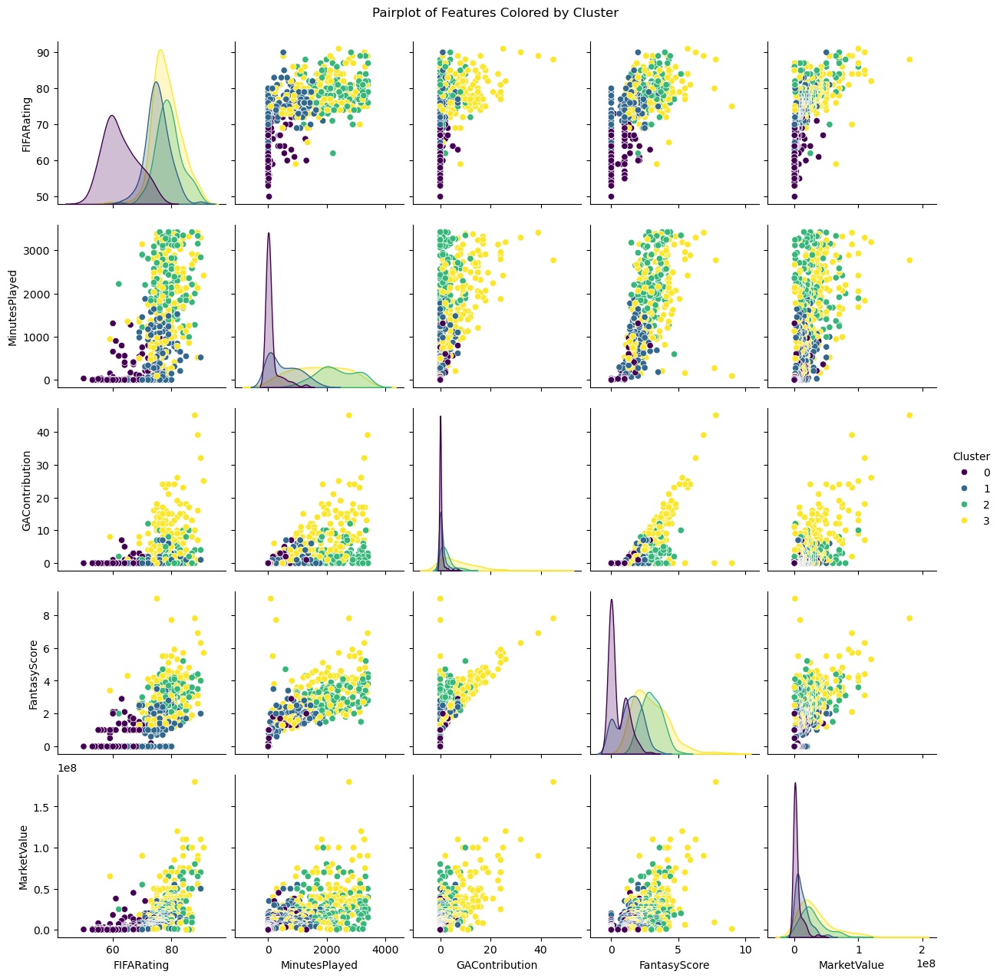

In [72]:
# Euclidean 4 E4

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AgeGroup",
    "Position",
    "FIFARating",
    "MinutesPlayed",
    "GAContribution",
    "FantasyScore",
    "MarketValue",
]

# Encoding qualitative variables
label_encoders = {}
for col in ["AgeGroup", "Position"]:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 4  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="euclidean", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="euclidean")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="euclidean"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="euclidean")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["FIFARating", "MinutesPlayed", "GAContribution", "FantasyScore", "MarketValue"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="euclidean")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="euclidean")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="euclidean")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("E4cluster_summary.csv", index=False)
validity_metrics_df.to_csv("E4cluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("E4medoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("E4pairplot_clusters.png")
plt.show()


Cluster Summary:
   Cluster Number  Total Members IQR FIFARating (25%-75%)  \
0               0            110             (58.0, 64.0)   
1               1             92             (72.0, 77.0)   
2               2            104             (75.0, 80.0)   
3               3            142             (73.0, 79.0)   
4               4            128             (77.0, 84.0)   

  IQR MinutesPlayed (25%-75%) IQR GAContribution (25%-75%)  \
0                  (0.0, 1.0)                   (0.0, 0.0)   
1                (0.0, 728.5)                   (0.0, 1.0)   
2            (1249.5, 2216.0)                  (0.75, 3.0)   
3           (333.75, 1566.25)                   (0.0, 4.0)   
4          (2090.25, 3067.75)                 (3.75, 14.0)   

  IQR FantasyScore (25%-75%) IQR MarketValue (25%-75%)  \
0               (0.0, 0.375)     (250000.0, 2000000.0)   
1                 (0.0, 1.8)   (2950000.0, 13250000.0)   
2                 (2.0, 2.9)  (18000000.0, 35000000.0)   
3          

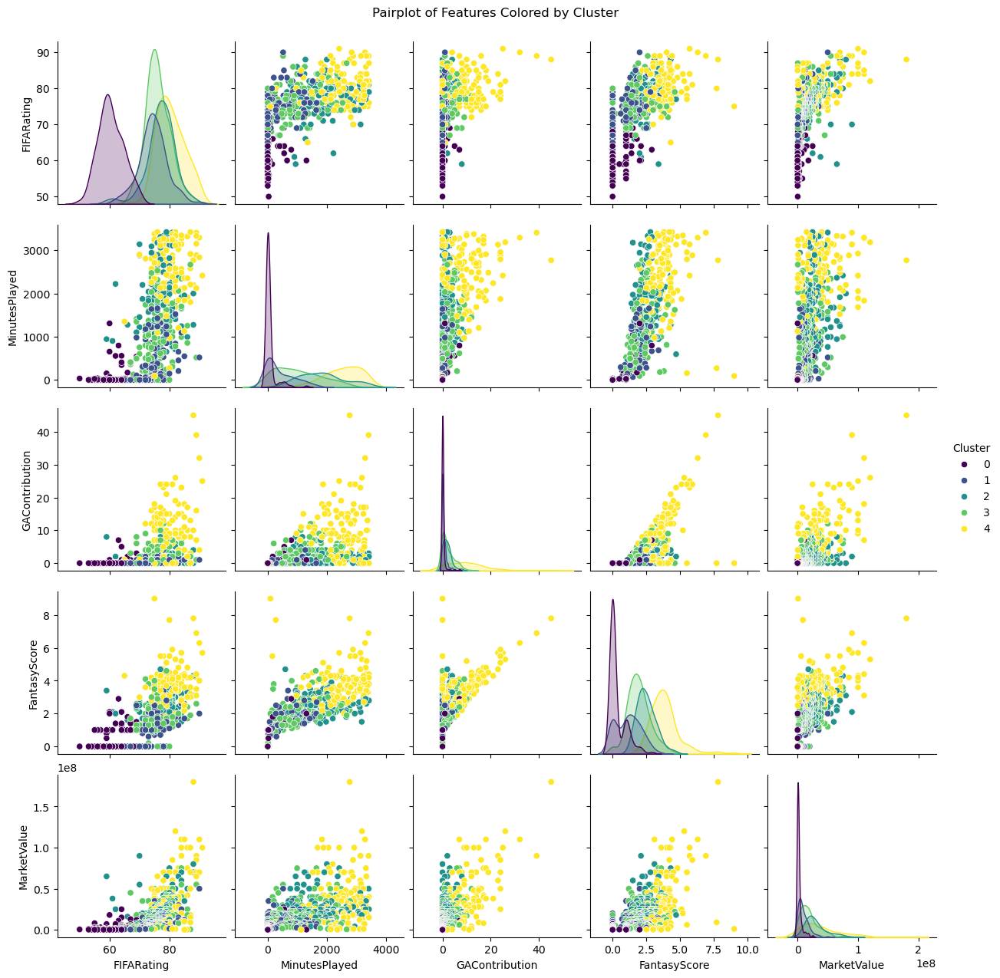

In [74]:
# Euclidean 5 E5

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AgeGroup",
    "Position",
    "FIFARating",
    "MinutesPlayed",
    "GAContribution",
    "FantasyScore",
    "MarketValue",
]

# Encoding qualitative variables
label_encoders = {}
for col in ["AgeGroup", "Position"]:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 5  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="euclidean", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="euclidean")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="euclidean"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="euclidean")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["FIFARating", "MinutesPlayed", "GAContribution", "FantasyScore", "MarketValue"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="euclidean")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="euclidean")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="euclidean")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("E5cluster_summary.csv", index=False)
validity_metrics_df.to_csv("E5cluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("E5medoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("E5pairplot_clusters.png")
plt.show()


Cluster Summary:
   Cluster Number  Total Members IQR FIFARating (25%-75%)  \
0               0            108            (59.75, 73.0)   
1               1             55             (74.0, 79.0)   
2               2             40             (76.0, 80.0)   
3               3             65             (77.0, 83.0)   
4               4            153             (76.0, 83.0)   
5               5            155             (62.0, 76.0)   

  IQR MinutesPlayed (25%-75%) IQR GAContribution (25%-75%)  \
0                 (0.0, 34.5)                   (0.0, 0.0)   
1             (854.0, 1476.5)                   (0.0, 1.0)   
2           (1993.5, 2882.25)                   (1.0, 3.0)   
3             (762.0, 1608.0)                   (2.0, 9.0)   
4            (2059.0, 2953.0)                  (1.0, 12.0)   
5                (0.0, 803.5)                   (0.0, 1.0)   

    IQR FantasyScore (25%-75%) IQR MarketValue (25%-75%)  \
0                   (0.0, 1.0)     (437500.0, 5625000.0)   


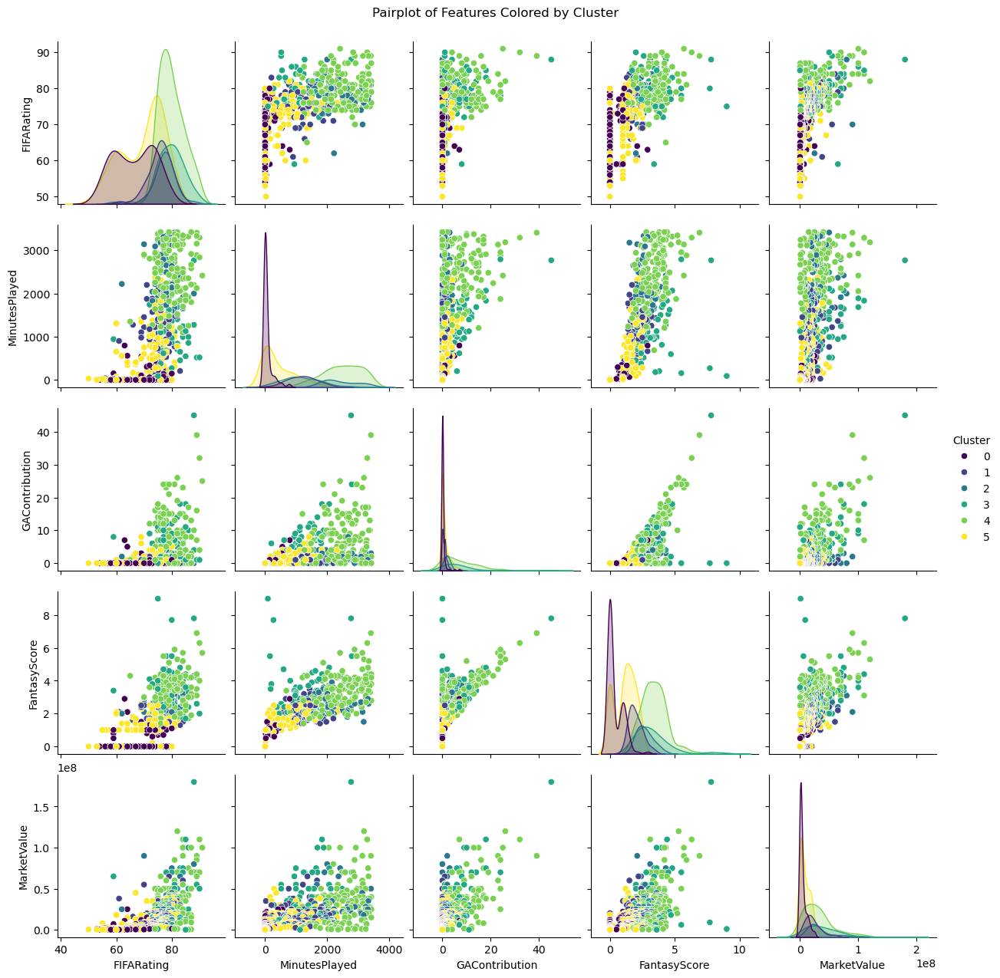

In [76]:
# Euclidean 6 E6

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AgeGroup",
    "Position",
    "FIFARating",
    "MinutesPlayed",
    "GAContribution",
    "FantasyScore",
    "MarketValue",
]

# Encoding qualitative variables
label_encoders = {}
for col in ["AgeGroup", "Position"]:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 6  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="euclidean", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="euclidean")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="euclidean"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="euclidean")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["FIFARating", "MinutesPlayed", "GAContribution", "FantasyScore", "MarketValue"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="euclidean")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="euclidean")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="euclidean")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("E6cluster_summary.csv", index=False)
validity_metrics_df.to_csv("E6cluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("E6medoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("E6pairplot_clusters.png")
plt.show()


Cluster Summary:
   Cluster Number  Total Members IQR FIFARating (25%-75%)  \
0               0            282             (76.0, 82.0)   
1               1            294             (62.0, 75.0)   

  IQR MinutesPlayed (25%-75%) IQR GAContribution (25%-75%)  \
0           (1489.75, 2761.0)                   (1.0, 9.0)   
1                (0.0, 610.5)                   (0.0, 1.0)   

  IQR FantasyScore (25%-75%) IQR MarketValue (25%-75%)  \
0                 (2.3, 3.7)  (17000000.0, 42000000.0)   
1                 (0.0, 1.6)   (1000000.0, 12750000.0)   

   Average Silhouette Score  Average Distance from Medoid  
0                  0.417512                      0.510311  
1                  0.446136                      0.442031  

Validity Metrics:
                 Metric       Value
0      Silhouette Index    0.432122
1  Davies-Bouldin Index    1.393338
2               Inertia  273.864763
3          Average WCSS   86.097135

Medoid Distance Matrix:
           Cluster 0  Cluster 1
C

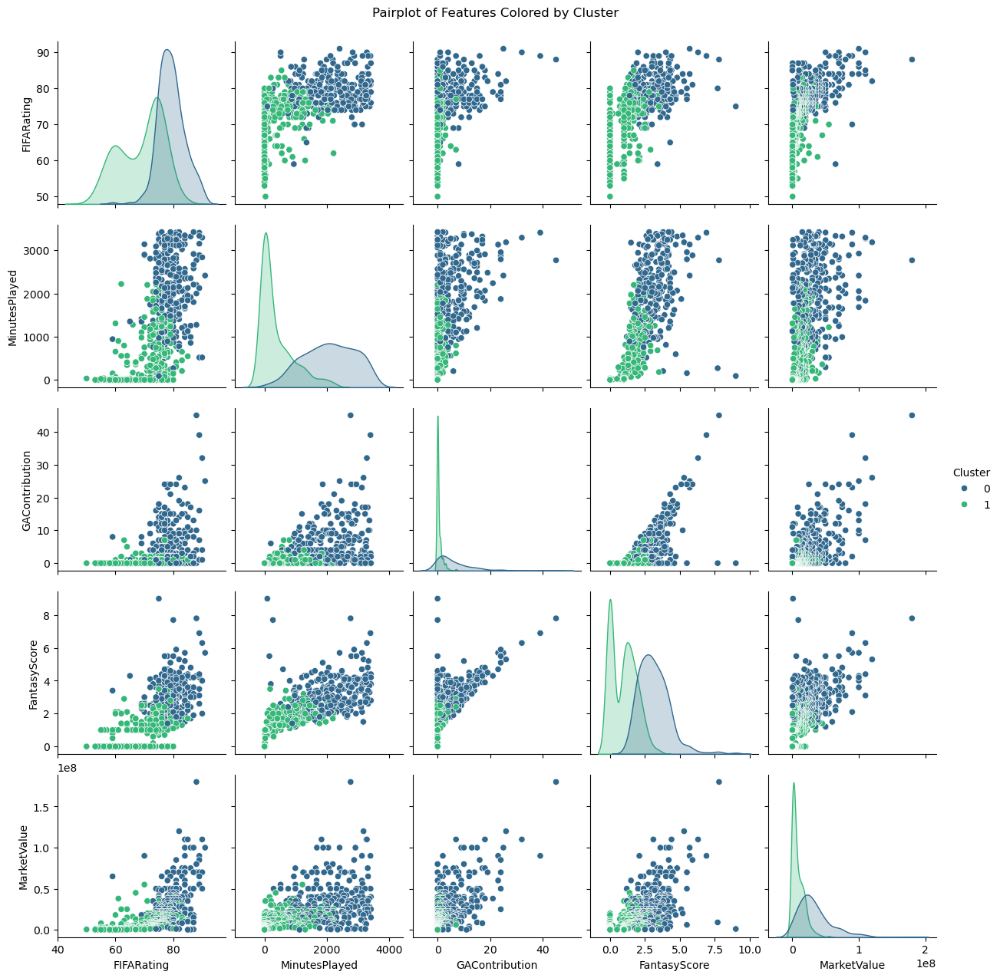

In [78]:
# Cosine 2 C2

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AgeGroup",
    "Position",
    "FIFARating",
    "MinutesPlayed",
    "GAContribution",
    "FantasyScore",
    "MarketValue",
]

# Encoding qualitative variables
label_encoders = {}
for col in ["AgeGroup", "Position"]:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 2  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="cosine", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="cosine")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="cosine"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="cosine")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["FIFARating", "MinutesPlayed", "GAContribution", "FantasyScore", "MarketValue"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cosine")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cosine")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="cosine")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("C2cluster_summary.csv", index=False)
validity_metrics_df.to_csv("C2cluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("C2medoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("C2pairplot_clusters.png")
plt.show()


Cluster Summary:
   Cluster Number  Total Members IQR FIFARating (25%-75%)  \
0               0            186             (76.0, 82.0)   
1               1            208             (60.0, 73.0)   
2               2            182             (75.0, 80.0)   

  IQR MinutesPlayed (25%-75%) IQR GAContribution (25%-75%)  \
0           (1352.25, 2722.5)                 (1.0, 11.75)   
1                (0.0, 209.5)                   (0.0, 0.0)   
2            (815.0, 2197.75)                   (0.0, 3.0)   

  IQR FantasyScore (25%-75%) IQR MarketValue (25%-75%)  \
0                 (2.2, 4.0)  (15000000.0, 45000000.0)   
1                 (0.0, 1.3)    (400000.0, 11000000.0)   
2                 (1.8, 2.9)   (8000000.0, 30000000.0)   

   Average Silhouette Score  Average Distance from Medoid  
0                  0.344371                      0.415683  
1                  0.561148                      0.276770  
2                  0.332555                      0.390810  

Validity Metric

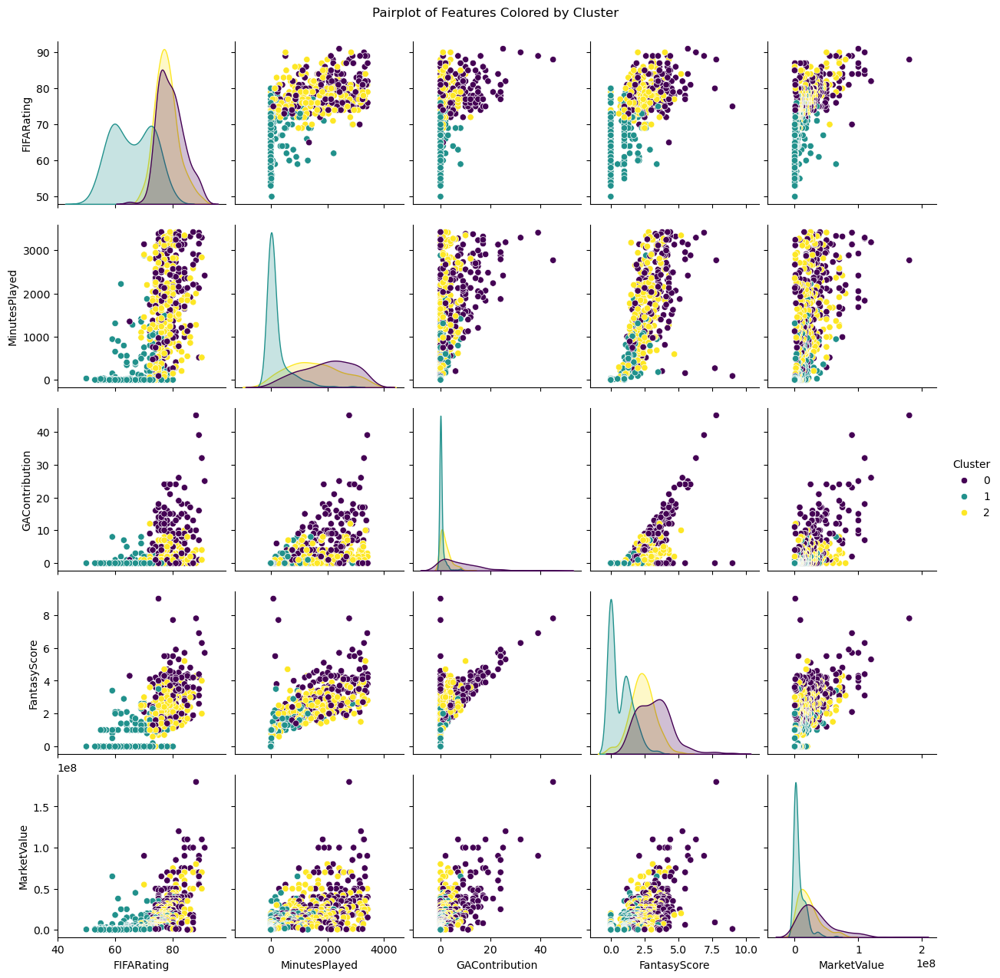

In [10]:
# Cosine 3 C3

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AgeGroup",
    "Position",
    "FIFARating",
    "MinutesPlayed",
    "GAContribution",
    "FantasyScore",
    "MarketValue",
]

# Encoding qualitative variables
label_encoders = {}
for col in ["AgeGroup", "Position"]:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 3  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="cosine", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="cosine")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="cosine"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="cosine")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["FIFARating", "MinutesPlayed", "GAContribution", "FantasyScore", "MarketValue"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cosine")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cosine")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="cosine")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("C3cluster_summary.csv", index=False)
validity_metrics_df.to_csv("C3cluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("C3medoid_distance_matrix.csv")
data.to_csv("Kdata.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("C3pairplot_clusters.png")
plt.show()


Cluster Summary:
   Cluster Number  Total Members IQR FIFARating (25%-75%)  \
0               0            102             (74.0, 80.0)   
1               1            173             (76.0, 82.0)   
2               2            113             (74.0, 78.0)   
3               3            188             (59.0, 73.0)   

  IQR MinutesPlayed (25%-75%) IQR GAContribution (25%-75%)  \
0            (307.25, 2127.0)                   (0.0, 5.0)   
1            (1803.0, 2953.0)                  (2.0, 10.0)   
2             (345.0, 1521.0)                   (0.0, 1.0)   
3                (0.0, 346.0)                   (0.0, 0.0)   

  IQR FantasyScore (25%-75%) IQR MarketValue (25%-75%)  \
0                 (1.4, 2.9)   (3000000.0, 18000000.0)   
1                 (2.7, 4.0)  (25000000.0, 55000000.0)   
2                 (1.4, 2.4)   (5000000.0, 17000000.0)   
3                 (0.0, 1.4)    (387500.0, 13000000.0)   

   Average Silhouette Score  Average Distance from Medoid  
0              

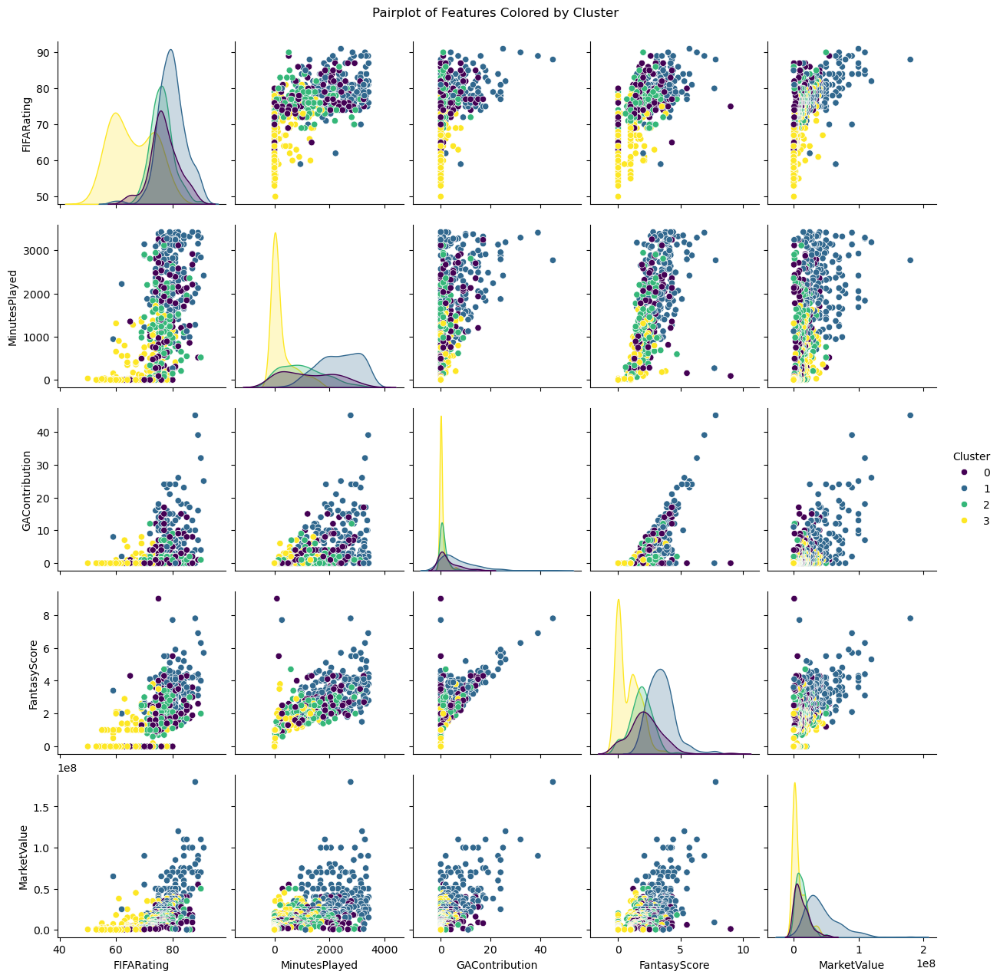

In [82]:
# Cosine 4 C4

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AgeGroup",
    "Position",
    "FIFARating",
    "MinutesPlayed",
    "GAContribution",
    "FantasyScore",
    "MarketValue",
]

# Encoding qualitative variables
label_encoders = {}
for col in ["AgeGroup", "Position"]:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 4  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="cosine", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="cosine")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="cosine"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="cosine")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["FIFARating", "MinutesPlayed", "GAContribution", "FantasyScore", "MarketValue"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cosine")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cosine")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="cosine")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("C4cluster_summary.csv", index=False)
validity_metrics_df.to_csv("C4cluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("C4medoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("C4pairplot_clusters.png")
plt.show()


Cluster Summary:
   Cluster Number  Total Members IQR FIFARating (25%-75%)  \
0               0            145             (76.0, 83.0)   
1               1             88            (76.75, 81.0)   
2               2             96             (74.0, 79.0)   
3               3             87             (59.0, 71.5)   
4               4            160             (62.0, 75.0)   

  IQR MinutesPlayed (25%-75%) IQR GAContribution (25%-75%)  \
0            (1740.0, 2782.0)                  (4.0, 13.0)   
1           (1671.25, 3067.0)                   (1.0, 4.0)   
2            (502.0, 1602.75)                   (0.0, 1.0)   
3                (0.0, 288.0)                   (0.0, 0.0)   
4                (0.0, 555.5)                   (0.0, 1.0)   

  IQR FantasyScore (25%-75%) IQR MarketValue (25%-75%)  \
0                 (2.6, 4.1)  (17000000.0, 50000000.0)   
1               (2.475, 3.6)  (22000000.0, 46250000.0)   
2                 (1.4, 2.5)   (5000000.0, 18000000.0)   
3  (0.0, 1.

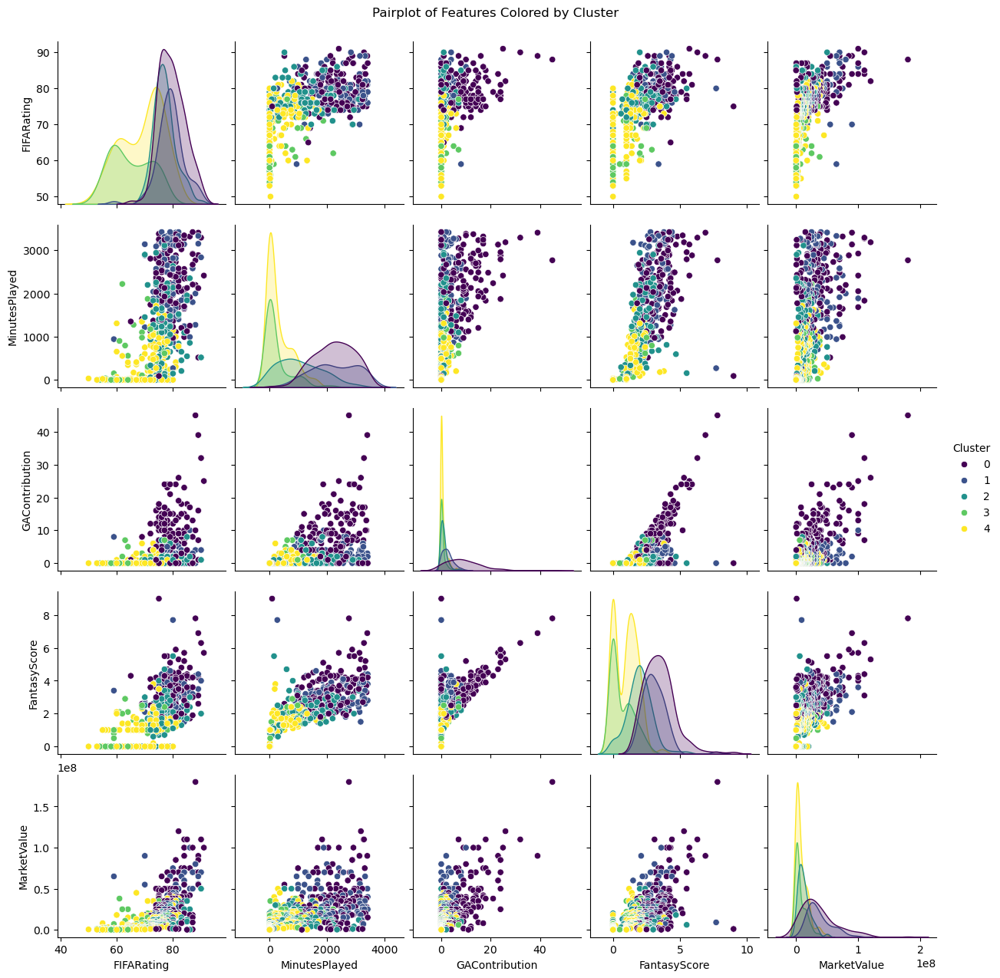

In [84]:
# Cosine 5 C5

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AgeGroup",
    "Position",
    "FIFARating",
    "MinutesPlayed",
    "GAContribution",
    "FantasyScore",
    "MarketValue",
]

# Encoding qualitative variables
label_encoders = {}
for col in ["AgeGroup", "Position"]:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 5  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="cosine", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="cosine")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="cosine"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="cosine")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["FIFARating", "MinutesPlayed", "GAContribution", "FantasyScore", "MarketValue"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cosine")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cosine")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="cosine")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("C5cluster_summary.csv", index=False)
validity_metrics_df.to_csv("C5cluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("C5medoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("C5pairplot_clusters.png")
plt.show()


Cluster Summary:
   Cluster Number  Total Members IQR FIFARating (25%-75%)  \
0               0            135             (76.0, 83.0)   
1               1             78             (76.0, 81.0)   
2               2             86             (76.0, 80.0)   
3               3             78            (59.25, 73.0)   
4               4            119             (60.0, 73.0)   
5               5             80             (72.0, 77.0)   

  IQR MinutesPlayed (25%-75%) IQR GAContribution (25%-75%)  \
0            (1768.0, 2805.0)                  (5.0, 14.0)   
1           (1823.75, 3081.0)                  (1.0, 3.75)   
2             (762.0, 1917.5)                   (0.0, 2.0)   
3                (0.0, 442.0)                   (0.0, 0.0)   
4                (0.0, 513.0)                   (0.0, 1.0)   
5                (0.0, 588.5)                  (0.0, 0.25)   

  IQR FantasyScore (25%-75%) IQR MarketValue (25%-75%)  \
0                 (2.6, 4.1)  (20000000.0, 50000000.0)   
1   

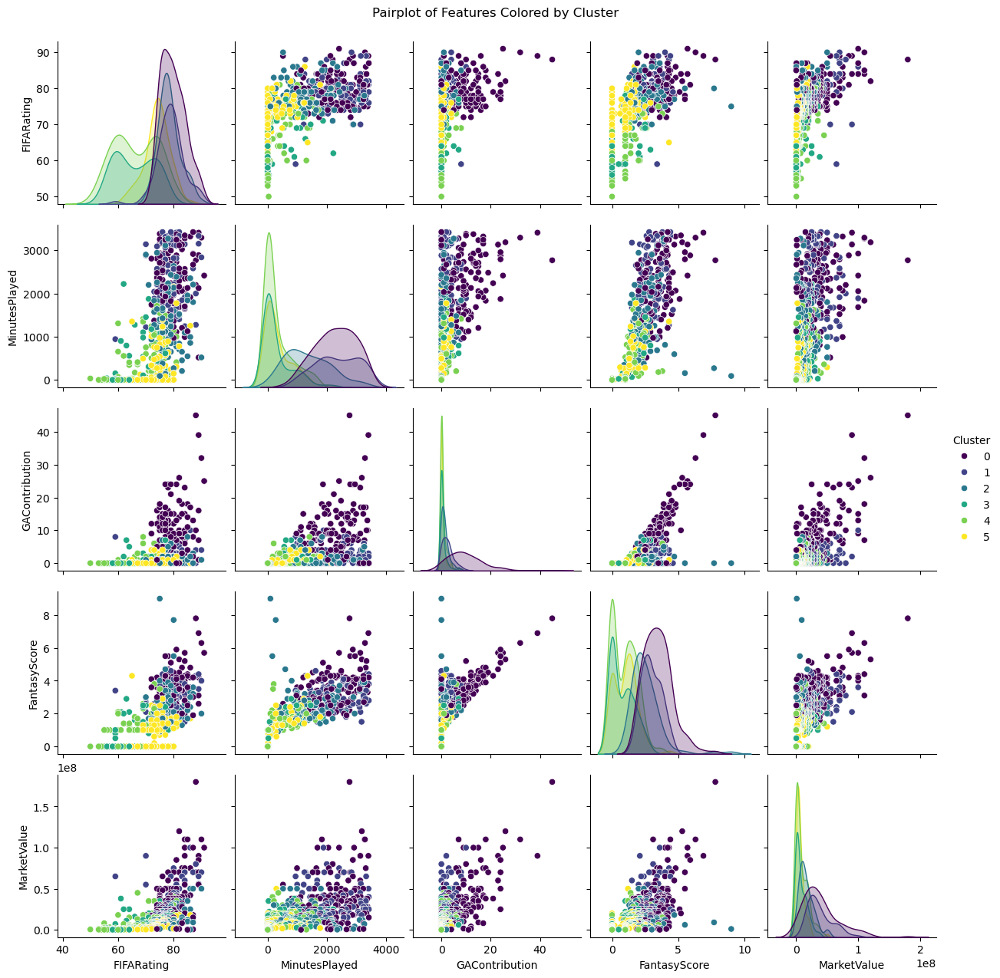

In [86]:
# Cosine 6 C6

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AgeGroup",
    "Position",
    "FIFARating",
    "MinutesPlayed",
    "GAContribution",
    "FantasyScore",
    "MarketValue",
]

# Encoding qualitative variables
label_encoders = {}
for col in ["AgeGroup", "Position"]:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 6  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="cosine", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="cosine")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="cosine"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="cosine")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["FIFARating", "MinutesPlayed", "GAContribution", "FantasyScore", "MarketValue"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cosine")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cosine")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="cosine")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("C6cluster_summary.csv", index=False)
validity_metrics_df.to_csv("C6cluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("C6medoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("C6pairplot_clusters.png")
plt.show()
